# To predict alzheimer disease

In [1]:
!pip install dataprep by

     |████████████████████████████████| 1.8 MB 819 kB/s eta 0:00:01
     |████████████████████████████████| 125 kB 43.9 MB/s eta 0:00:01
     |████████████████████████████████| 1.5 MB 35.4 MB/s eta 0:00:01
     |████████████████████████████████| 63 kB 1.9 MB/s  eta 0:00:01
     |████████████████████████████████| 719 kB 40.1 MB/s eta 0:00:01
     |████████████████████████████████| 848 kB 52.9 MB/s eta 0:00:01
     |████████████████████████████████| 49 kB 4.5 MB/s  eta 0:00:01
     |████████████████████████████████| 743 kB 58.1 MB/s eta 0:00:01
  Created wheel for metaphone: filename=Metaphone-0.6-py3-none-any.whl size=13905 sha256=e23d605f58248da746ef9759ed3e39545fe566ac65d5c68e838ce9215df0e687
  Stored in directory: /root/.cache/pip/wheels/1d/a8/cb/6f8902aa5457bd71344e00665c230e9c45255b3f57f2194a0f
Successfully built metaphone
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 3.0.1
    Uninstalling Jinja2-3.0.1:
      Successfully uninstalled Jinja2-3.0.1
  Attempt

In [2]:
%matplotlib inline
import keras
import glob
import seaborn as sns
import pandas as pd
import numpy as np
import timeit
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils

In [122]:
dataset=pd.read_csv('../input/oasis_cross-sectional.csv') 
dataset = dataset.fillna(method='ffill')
dataset.head()

,ID,M/F,Hand,Age,Educ,SES,MMSE,CDR,eTIV,nWBV,ASF,Delay
0,OAS1_0001_MR1,F,R,74,2.0,3.0,29.0,0.0,1344,0.743,1.306,NaN
1,OAS1_0002_MR1,F,R,55,4.0,1.0,29.0,0.0,1147,0.810,1.531,NaN
2,OAS1_0003_MR1,F,R,73,4.0,3.0,27.0,0.5,1454,0.708,1.207,NaN
3,OAS1_0004_MR1,M,R,28,4.0,3.0,27.0,0.5,1588,0.803,1.105,NaN
4,OAS1_0005_MR1,M,R,18,4.0,3.0,27.0,0.5,1737,0.848,1.010,NaN


# Data Visualization and Preprocessing

In [71]:
dataset.shape

(1308, 12)

In [72]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1308 entries, 0 to 1307
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      1308 non-null   object 
 1   M/F     1308 non-null   object 
 2   Hand    1308 non-null   object 
 3   Age     1308 non-null   int64  
 4   Educ    1308 non-null   float64
 5   SES     1308 non-null   float64
 6   MMSE    1308 non-null   float64
 7   CDR     1308 non-null   float64
 8   eTIV    1308 non-null   int64  
 9   nWBV    1308 non-null   float64
 10  ASF     1308 non-null   float64
 11  Delay   60 non-null     float64
dtypes: float64(7), int64(2), object(3)
memory usage: 122.8+ KB


Populating the interactive namespace from numpy and matplotlib


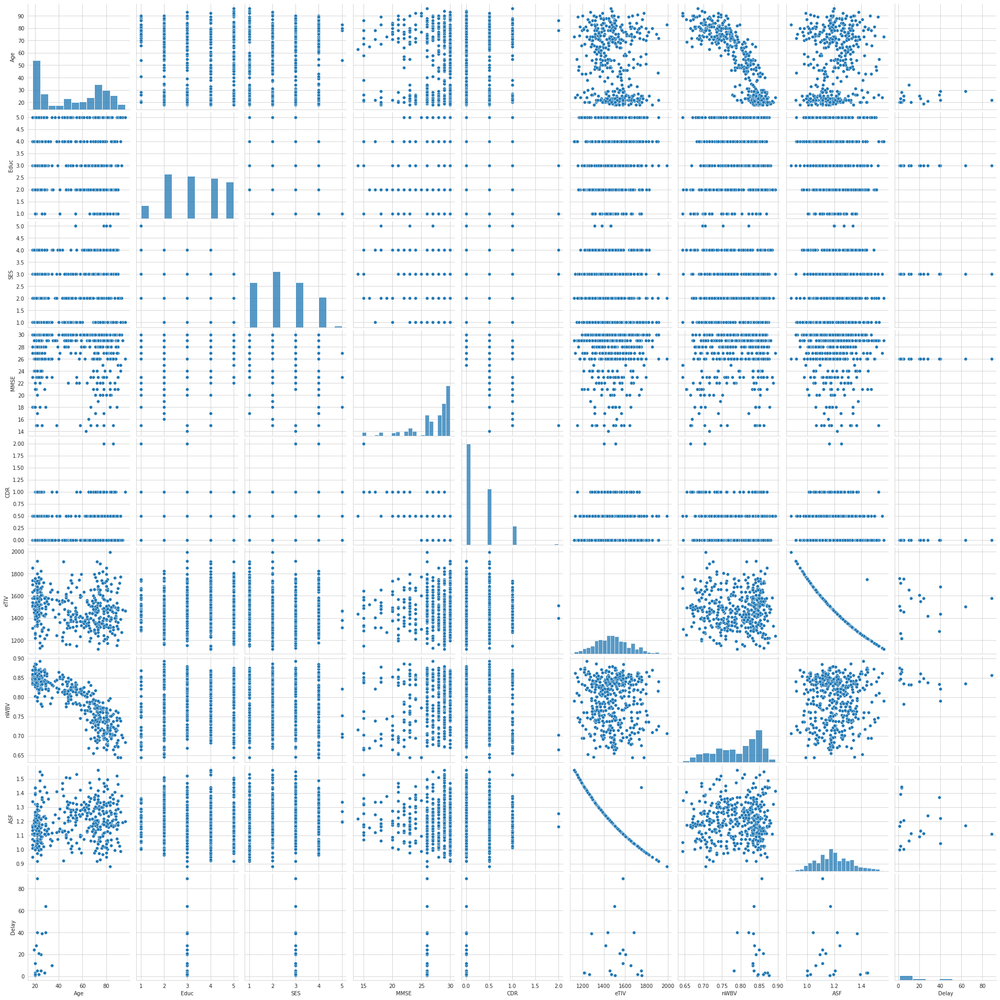

In [74]:
%pylab inline
#lets plot some graphics from the first dataset

from pylab import rcParams
rcParams['figure.figsize'] = 8, 5
cols = ['Age','MR Delay', 'EDUC', 'SES', 'MMSE', 'CDR','eTIV','nWBV','ASF']
x=dataset.fillna('')
sns.set_style("whitegrid");
sns.pairplot(dataset,  size=3);
plt.show()

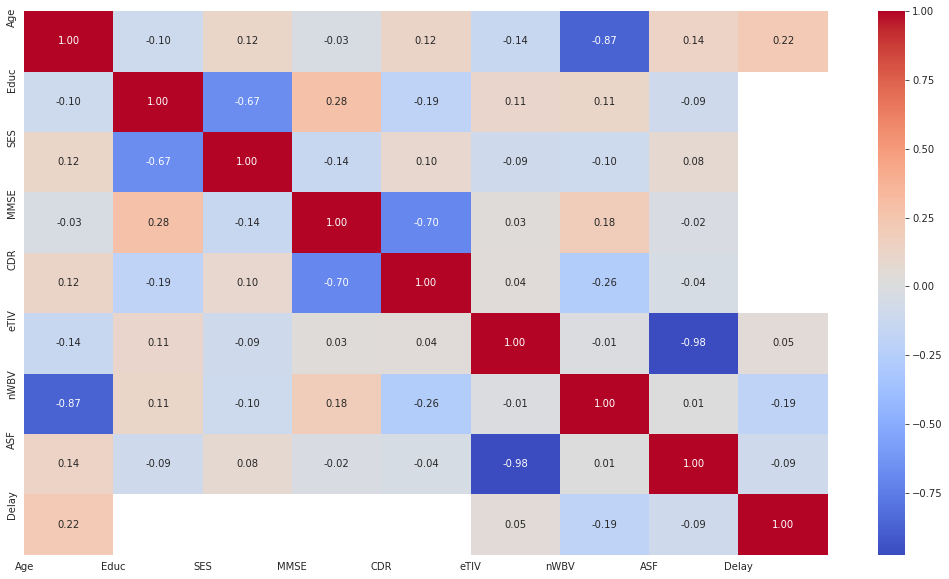

In [75]:
corr = dataset.corr()
fig, ax = plt.subplots(figsize=(18, 10))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f")
plt.xticks(range(len(corr.columns)), corr.columns)
plt.yticks(range(len(corr.columns)), corr.columns)
plt.show()

In [76]:
dataset.isnull().sum()

ID          0
M/F         0
Hand        0
Age         0
Educ        0
SES         0
MMSE        0
CDR         0
eTIV        0
nWBV        0
ASF         0
Delay    1248
dtype: int64

In [79]:
#cdr=dataset["CDR"]
dataset['CDR'].replace(to_replace=0.0, value='A', inplace=True)
dataset['CDR'].replace(to_replace=0.5, value='B', inplace=True)
dataset['CDR'].replace(to_replace=1.0, value='C', inplace=True)
dataset['CDR'].replace(to_replace=2.0, value='D', inplace=True)

In [80]:
from sklearn.preprocessing import LabelEncoder
#from sklearn.cross_validation import train_test_split
for x in dataset.columns:
    f = LabelEncoder()
    dataset[x] = f.fit_transform(dataset[x])

In [81]:
dataset.head()

,ID,M/F,Hand,Age,Educ,SES,MMSE,CDR,eTIV,nWBV,ASF,Delay
0,0,0,0,51,1,2,15,0,67,62,214,618
1,1,0,0,33,3,0,15,0,2,115,279,836
2,2,0,0,50,3,2,13,1,140,34,148,835
3,3,1,0,10,3,2,13,1,228,109,73,834
4,4,1,0,0,3,2,13,1,284,151,24,833


## Outlier analysis

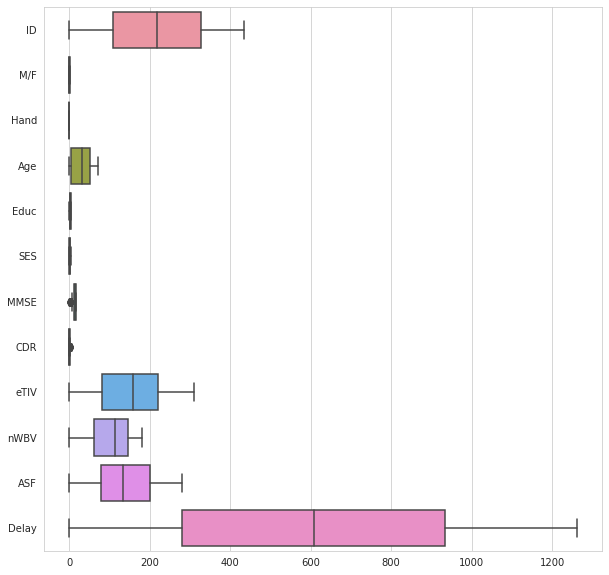

In [82]:
plt.figure(figsize=(10,10))
sns.boxplot(data=dataset, orient="h");

In [83]:
from dataprep.eda import *
from dataprep.eda import plot
from dataprep.eda import plot_correlation
from dataprep.eda import plot_missing
import plotly.express as px
import plotly.figure_factory as ff

  0%|          | 0/567 [00:00<?, ?it/s]


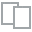
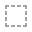
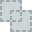
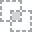
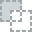
...
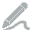
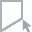
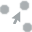
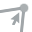
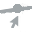

In [84]:
plot(dataset)

  0%|          | 0/110 [00:00<?, ?it/s]


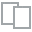
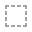
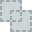
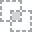
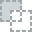
...
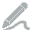
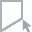
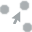
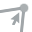
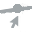

In [85]:
plot(dataset, 'eTIV')

  0%|          | 0/1743 [00:00<?, ?it/s]

DataPrep Report
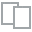
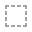
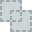
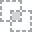
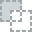
...
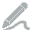
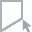
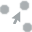
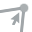
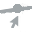

In [86]:
create_report(dataset)

# Lets begin some machine learning

In [89]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(dataset, test_size=0.2)
X_train = train[['M/F', 'Age', 'SES',  'eTIV', 'ASF']]
y_train = train.CDR
X_test = test[['M/F', 'Age',  'SES',  'eTIV',  'ASF']]
y_test = test.CDR

In [90]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [91]:
y_train=np.ravel(y_train)
X_train=np.asarray(X_train)
y_test=np.ravel(y_test)
X_test=np.asarray(X_test)

In [92]:
!pip install catboost
!pip install xgboost
!pip install lightgbm

In [93]:
global df
df =pd.DataFrame(columns=['Algorithm','Train_accuracy','Train_precision','Train_recall','Train_F1_Score',
                         'Validation_accuracy','Validation_precision','Validation_recall','Validation_F1_Score'])
def add_result(model, X_train, y_train, X_test, y_test,name):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    global df
    df = df.append({'Algorithm':name,
                    'Train_accuracy':accuracy_score(y_train,y_pred_train),
                    'Train_precision':precision_score(y_train,y_pred_train, average='weighted'),
                    'Train_recall':recall_score(y_train,y_pred_train, average='weighted'),
                    'Train_F1_Score':f1_score(y_train,y_pred_train, average='weighted'),
                    'Validation_accuracy':accuracy_score(y_test,y_pred_test),
                    'Validation_precision':precision_score(y_test,y_pred_test, average='weighted'),
                    'Validation_recall':recall_score(y_test,y_pred_test, average='weighted'),
                    'Validation_F1_Score':f1_score(y_test,y_pred_test, average='weighted'),
                       },ignore_index=True)

df

,Algorithm,Train_accuracy,Train_precision,Train_recall,Train_F1_Score,Validation_accuracy,Validation_precision,Validation_recall,Validation_F1_Score


In [94]:
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
def LR(X_train,y_train,X_test,y_test):
    from sklearn.linear_model import LogisticRegression
    clf = LogisticRegression(solver = 'liblinear' , random_state=0)#random_state=0, solver='lbfgs',multi_class='multinomial').fit(df_train, y_train)
    clf.fit(X_train, y_train)
    add_result(clf,X_train,y_train,X_test,y_test,'Logistic Regression')
    print("----------Logistic Regression----------")
def SGD(X_train,y_train,X_test,y_test):
    from sklearn.linear_model import SGDClassifier
    clf = SGDClassifier(loss="hinge", penalty="l2", max_iter=5)
    clf.fit(X_train, y_train)
    add_result(clf,X_train,y_train,X_test,y_test,'SGD')
    print("----------SGD----------")
def svm_scale(X_train,y_train,X_test,y_test):
    from sklearn import svm
    clf = svm.SVC(gamma='scale')
    clf.fit(X_train, y_train)
    add_result(clf,X_train,y_train,X_test,y_test,'SVM - Gamma --> scale')
    print("----------SVM - Gamma --> scale----------")
def svm_auto(X_train,y_train,X_test,y_test):
    from sklearn import svm
    clf = svm.SVC(gamma='auto')
    clf.fit(X_train, y_train)
    add_result(clf,X_train,y_train,X_test,y_test,'SVM - Gamma --> auto')
    print("----------SVM - Gamma --> auto----------")
def NuSVC(X_train,y_train,X_test,y_test):
    from sklearn.svm import NuSVC
    clf = NuSVC(gamma='scale')
    clf.fit(X_train, y_train)
    add_result(clf,X_train,y_train,X_test,y_test,'NuSVC')
    print("----------NuSVC----------")
def LinearSVC(X_train,y_train,X_test,y_test):
    from sklearn.svm import LinearSVC
    clf = LinearSVC(random_state=0, tol=1e-5)
    clf.fit(X_train, y_train)
    add_result(clf,X_train,y_train,X_test,y_test,'LinearSVM - Gamma --> scale')
    print("----------LinearSVM - Gamma --> scale----------")
def KNN(X_train,y_train,X_test,y_test):
    from sklearn.neighbors import  KNeighborsClassifier
    from sklearn.pipeline import Pipeline
    clf= KNeighborsClassifier(n_neighbors=2)
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'KNN')
    print("----------KNN----------")
def Gaussian(X_train,y_train,X_test,y_test):
    from sklearn.naive_bayes import GaussianNB
    clf = GaussianNB()
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'Gaussian')
    print("----------Gaussian----------")
def Bernouli(X_train,y_train,X_test,y_test):
    from sklearn.naive_bayes import BernoulliNB
    clf = BernoulliNB()
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'Bernouli')
    print("----------Bernouli----------")
def Tree(X_train,y_train,X_test,y_test):
    from sklearn import tree
    clf = tree.DecisionTreeClassifier(max_depth=None, min_samples_split=2,random_state=0)
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'Tree')
    print("----------Tree----------")
def RandomForest(X_train,y_train,X_test,y_test):
    from sklearn.ensemble import RandomForestClassifier
    clf = RandomForestClassifier(n_estimators=10, max_depth=None,min_samples_split=2, random_state=0)
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'Random Forest')
    print("----------Random Forest----------")
def Adaboost(X_train,y_train,X_test,y_test):
    from sklearn.ensemble import AdaBoostClassifier
    clf = AdaBoostClassifier(n_estimators=100)
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'Ada Boost')
    print("----------Ada Boost----------")
def Gradient(X_train,y_train,X_test,y_test):
    from sklearn.ensemble import GradientBoostingClassifier
    clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,max_depth=1, random_state=0).fit(X_train, y_train)
    add_result(clf,X_train,y_train,X_test,y_test,'Gradient Boosting')
    print("----------Gradient Boosting----------")
def MLP(X_train,y_train,X_test,y_test):
    from sklearn.neural_network import MLPClassifier
    clf = MLPClassifier(solver='lbfgs', alpha=1e-5,hidden_layer_sizes=(5, 2), random_state=1)
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'MLP')
    print("----------MLP----------")
def Cat(X_train,y_train,X_test,y_test):
    from catboost import CatBoostClassifier
    clf = CatBoostClassifier(depth=8,iterations=30,learning_rate=0.1,verbose=False)
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'Cataboost')
    print("----------CAT----------")   
def Light(X_train,y_train,X_test,y_test):
    from lightgbm import LGBMClassifier
    clf = LGBMClassifier( random_state=5)
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'LightGBM')
    print("----------Light----------")  
def XGB(X_train,y_train,X_test,y_test):
    from xgboost.sklearn import XGBClassifier
    clf = XGBClassifier(depth=8,iterations=30,learning_rate=0.1,verbose=False)
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'XGB')
    print("----------XGB----------")
def ML(X_train,y_train,X_test,y_test):
    LR(X_train,y_train,X_test,y_test)
    SGD(X_train,y_train,X_test,y_test)
    svm_scale(X_train,y_train,X_test,y_test)
    svm_auto(X_train,y_train,X_test,y_test)
    LinearSVC(X_train,y_train,X_test,y_test)
    KNN(X_train,y_train,X_test,y_test)
    Gaussian(X_train,y_train,X_test,y_test)
    Bernouli(X_train,y_train,X_test,y_test)
    Tree(X_train,y_train,X_test,y_test)
    RandomForest(X_train,y_train,X_test,y_test)
    Adaboost(X_train,y_train,X_test,y_test)
    Gradient(X_train,y_train,X_test,y_test)
    XGB(X_train,y_train,X_test,y_test)
    Cat(X_train,y_train,X_test,y_test)
    Light(X_train,y_train,X_test,y_test)

In [95]:
ML(X_train,y_train,X_test,y_test)

----------Logistic Regression----------
----------SGD----------
----------SVM - Gamma --> scale----------
----------SVM - Gamma --> auto----------
----------LinearSVM - Gamma --> scale----------
----------KNN----------
----------Gaussian----------
----------Bernouli----------
----------Tree----------
----------Random Forest----------
----------Ada Boost----------
----------Gradient Boosting----------
[05:40:30] WARNING: ../src/learner.cc:573: 
Parameters: { "depth", "iterations", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:40:30] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old b

In [96]:
df.sort_values(by=['Train_accuracy','Validation_accuracy'],ascending=False)

,Algorithm,Train_accuracy,Train_precision,Train_recall,Train_F1_Score,Validation_accuracy,Validation_precision,Validation_recall,Validation_F1_Score
8,Tree,1.000000,1.000000,1.000000,1.000000,0.977099,0.978418,0.977099,0.977193
14,LightGBM,1.000000,1.000000,1.000000,1.000000,0.977099,0.978609,0.977099,0.977242
9,Random Forest,0.998088,0.998094,0.998088,0.998087,0.961832,0.962406,0.961832,0.961860
12,XGB,0.991396,0.991483,0.991396,0.991307,0.954198,0.955220,0.954198,0.953833
5,KNN,0.987572,0.987718,0.987572,0.987526,0.877863,0.880420,0.877863,0.875746
11,Gradient Boosting,0.742830,0.748177,0.742830,0.725553,0.675573,0.679081,0.675573,0.648295
13,Cataboost,0.727533,0.764564,0.727533,0.685541,0.633588,0.680704,0.633588,0.574706
2,SVM - Gamma --> scale,0.611855,0.538618,0.611855,0.524917,0.545802,0.438138,0.545802,0.450902
3,SVM - Gamma --> auto,0.611855,0.538618,0.611855,0.524917,0.545802,0.438138,0.545802,0.450902
4,LinearSVM - Gamma --> scale,0.586042,0.501902,0.586042,0.459731,0.545802,0.449820,0.545802,0.424391


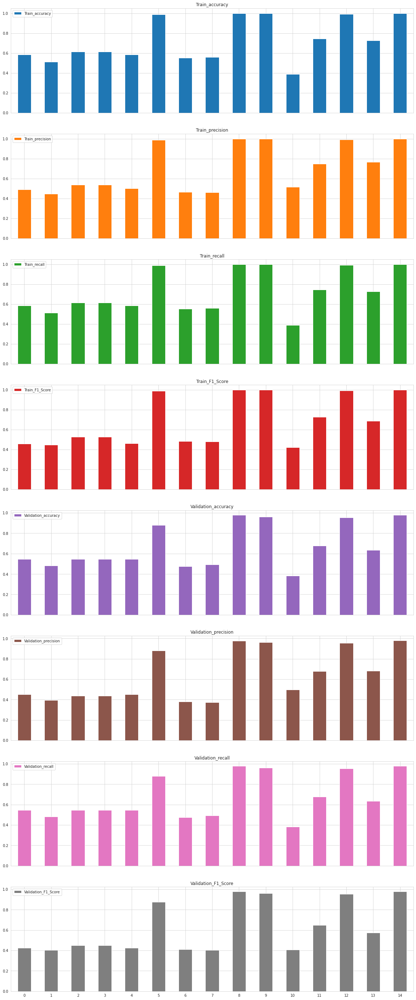

In [97]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,50)
axes = df.plot.bar(rot=0, subplots=True)
axes[1].legend(loc=2)  

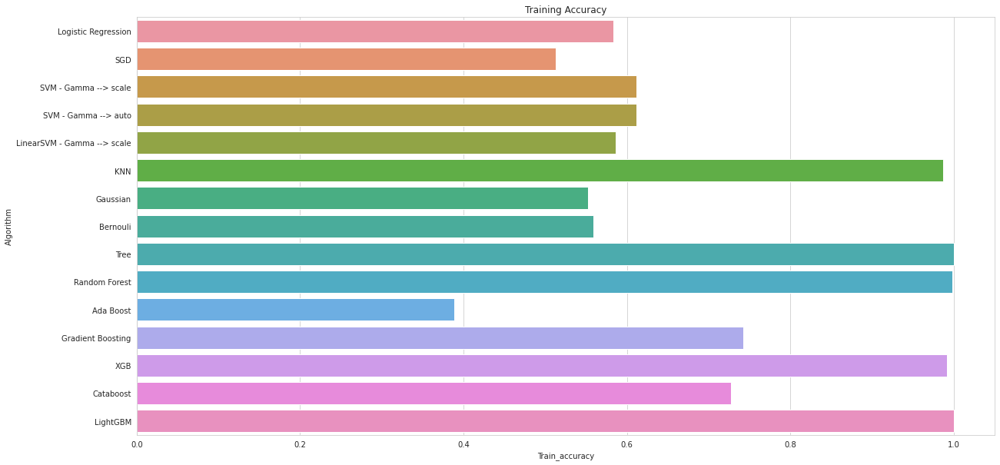

In [98]:
plt.rcParams["figure.figsize"] = (20,10)
import seaborn as sns
ax = sns.barplot(x="Train_accuracy", y="Algorithm", data=df).set_title('Training Accuracy')

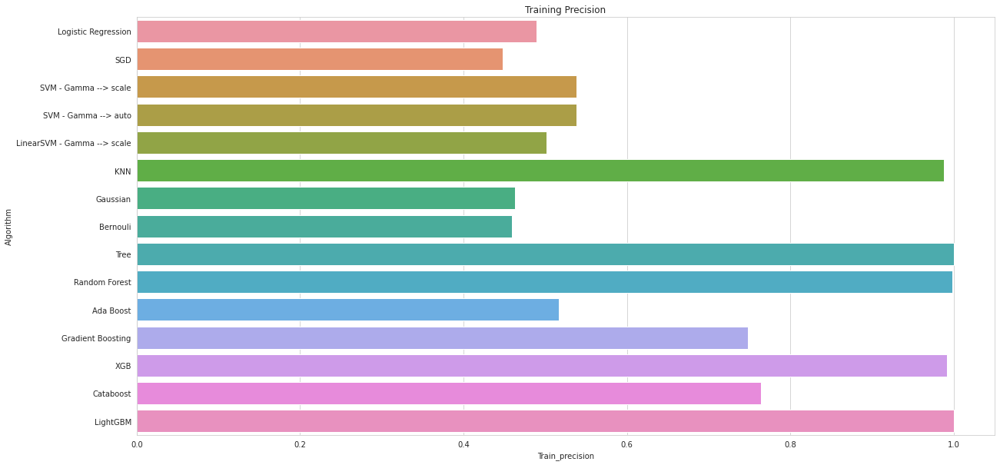

In [102]:
import seaborn as sns
ax = sns.barplot(x="Train_precision", y="Algorithm", data=df).set_title('Training Precision')
#ax.bar_label(ax.containers[0])

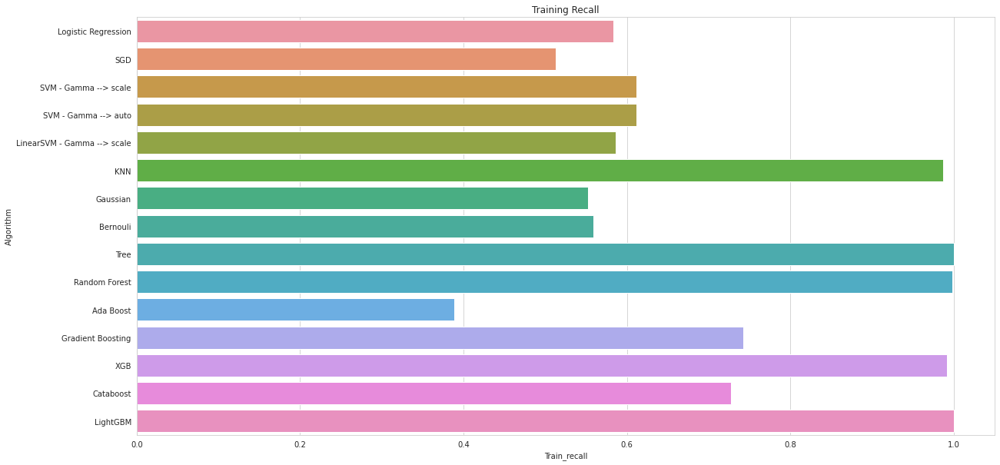

In [99]:
import seaborn as sns
ax = sns.barplot(x="Train_recall", y="Algorithm", data=df).set_title('Training Recall')

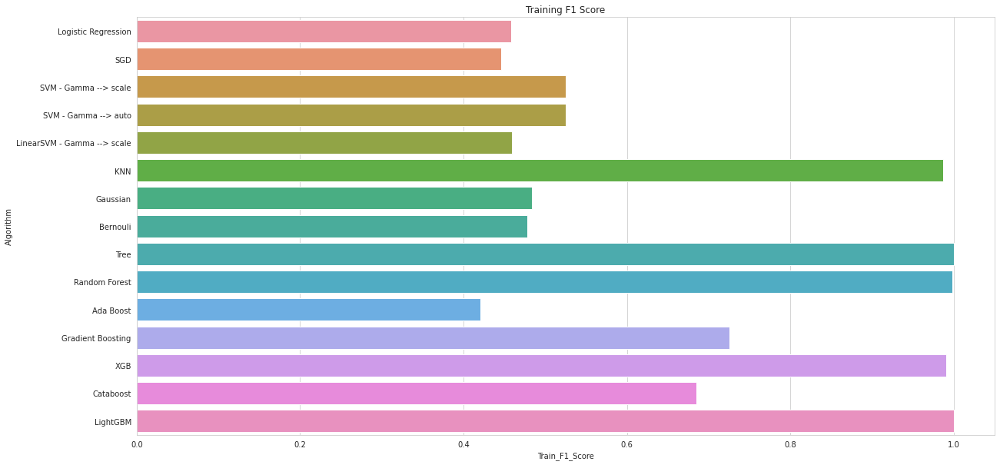

In [103]:
import seaborn as sns
ax = sns.barplot(x="Train_F1_Score", y="Algorithm", data=df).set_title('Training F1 Score')

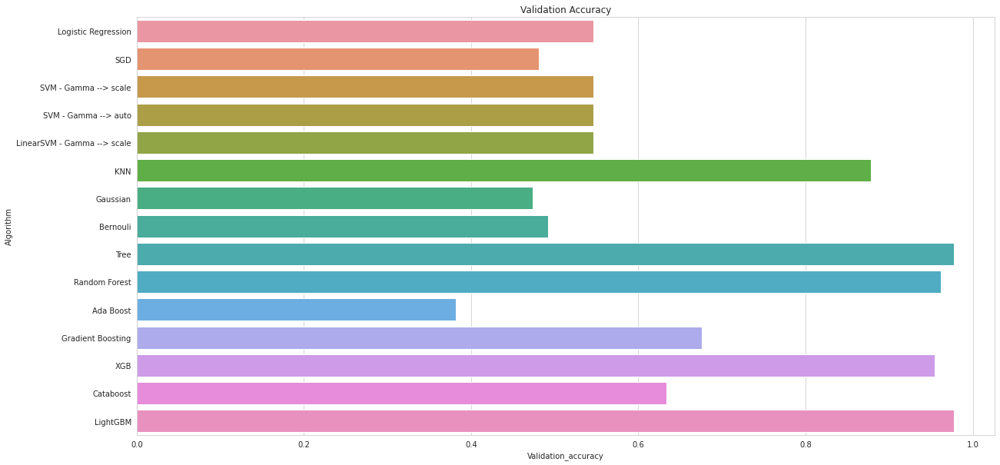

In [101]:
import seaborn as sns
ax = sns.barplot(x="Validation_accuracy", y="Algorithm", data=df).set_title('Validation Accuracy')

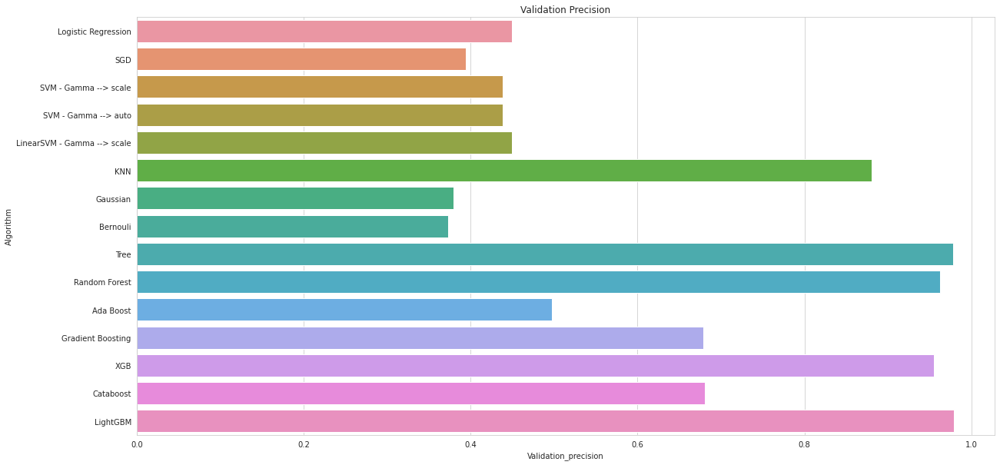

In [104]:
import seaborn as sns
ax = sns.barplot(x="Validation_precision", y="Algorithm", data=df).set_title('Validation Precision')

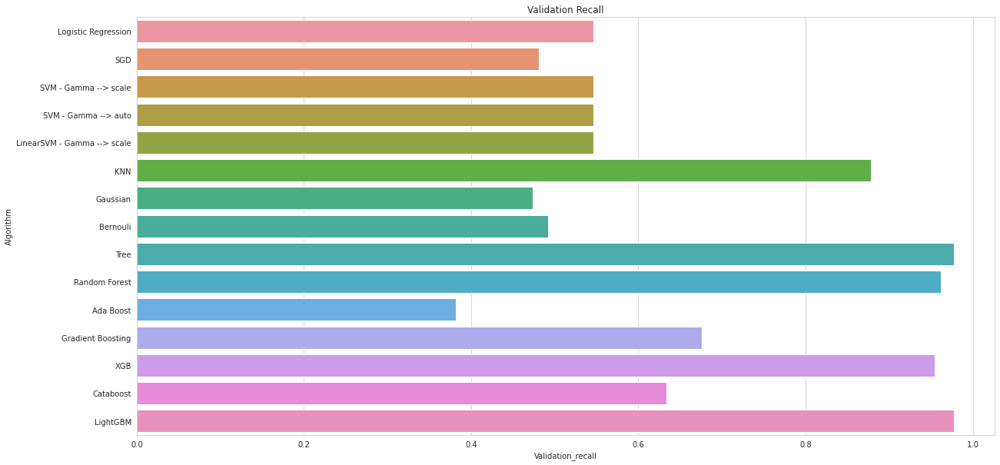

In [105]:
import seaborn as sns
ax = sns.barplot(x="Validation_recall", y="Algorithm", data=df).set_title('Validation Recall')

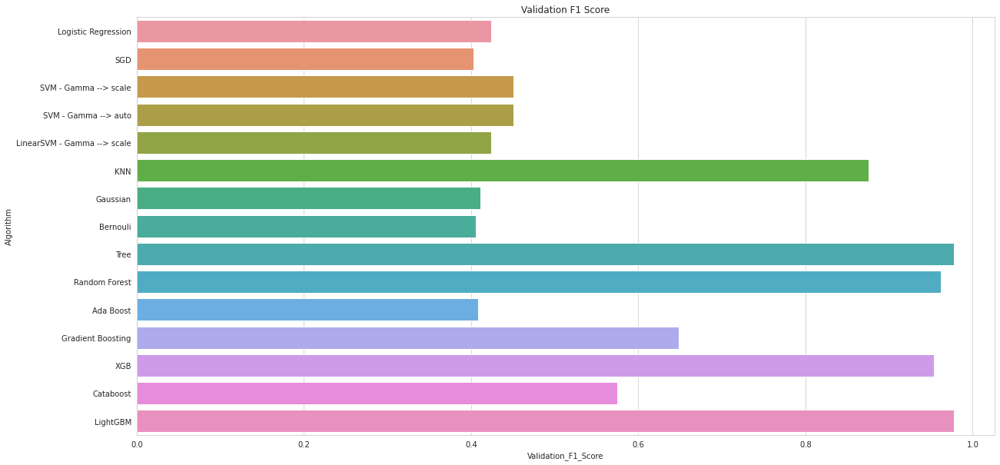

In [106]:
import seaborn as sns
ax = sns.barplot(x="Validation_F1_Score", y="Algorithm", data=df).set_title('Validation F1 Score')

# Final Model Selection

In [107]:
from sklearn import tree
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

In [108]:
import graphviz 
dot_data = tree.export_graphviz(clf, out_file=None) 
graph = graphviz.Source(dot_data) 
graph.render("dataset") 

'dataset.pdf'

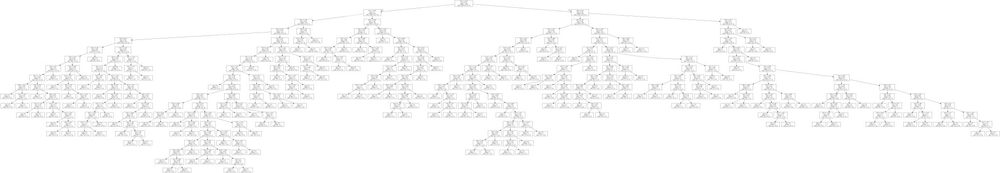

In [109]:
ot_data = tree.export_graphviz(clf, out_file=None, 
                     filled=True, rounded=True)  
graph = graphviz.Source(dot_data)  
graph 


[05:42:44] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


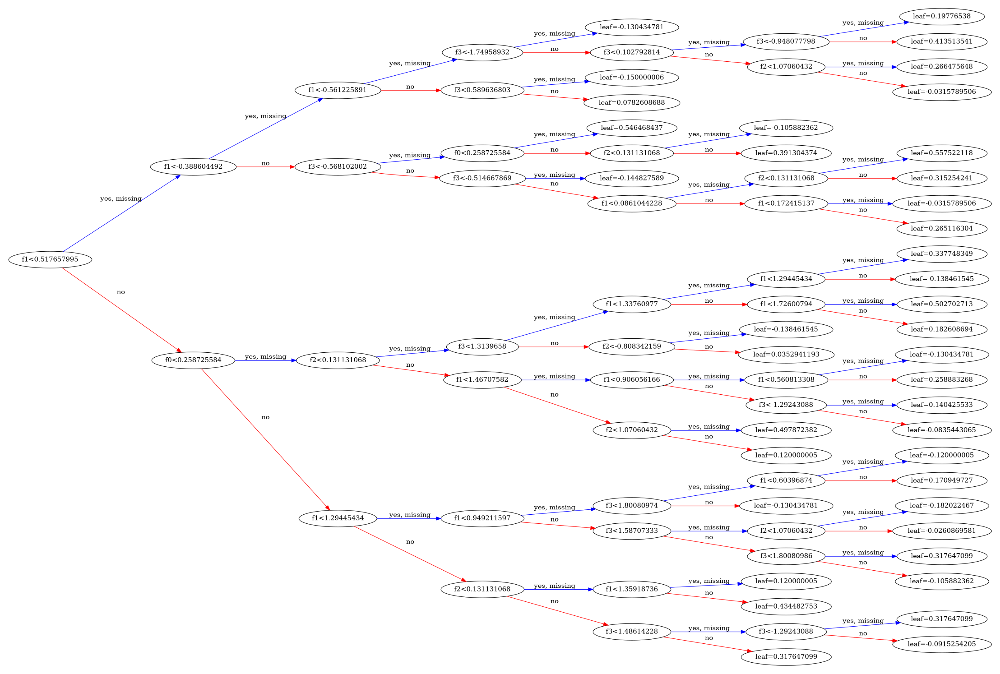

In [110]:
from xgboost import XGBClassifier
from xgboost import plot_tree
import matplotlib.pyplot as plt
model = XGBClassifier()
model.fit(X_train, y_train)
# plot single tree
fig = plt.figure(dpi=180)
ax = plt.subplot(1,1,1)
plot_tree(model,rankdir='LR',ax = ax)
plt.tight_layout()
plt.savefig("XGB_tree_structure.pdf")
plt.show()

In [111]:
df.to_csv('FMRI_ALGO_Data.csv',index = False)